In [14]:
# pip install scikit-image

In [15]:
# import skimage

In [16]:
# pip install plotly

In [17]:
# !pip install pooch

In [1]:
from skimage import data
import plotly
import plotly.express as px
import numpy as np

In [2]:
import skimage as ski
print(ski.__version__)

0.25.2


In [3]:
# pip install pooch

In [4]:
from skimage import data
img = data.cells3d()[20:]

In [5]:
img.shape

(40, 2, 256, 256)

In [6]:
# omit some slices that are partially empty
img = img[5:26]

In [7]:
img.shape

(21, 2, 256, 256)

In [13]:
# !pip install nbformat

In [15]:
upper_limit = 1.5 * np.percentile(img, q=99)
img = np.clip(img, 0, upper_limit)

fig = px.imshow(
    img,
    facet_col=1,
    animation_frame=0,
    binary_string=True,
    binary_format="jpg",
)
fig.layout.annotations[0]["text"] = "Cell membranes"
fig.layout.annotations[1]["text"] = "Nuclei"
plotly.io.show(fig)


In [9]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread, imsave , imshow

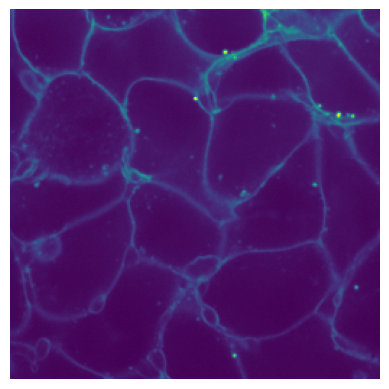

In [12]:
imshow(img[0,0])
plt.axis('off')  
plt.show()

hubble_deep_field   (872, 1000, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0..4095].


immunohistochemistry   (512, 512, 3)
lily   (922, 922, 4)
microaneurysms   (102, 102)
moon   (512, 512)
retina   (1411, 1411, 3)
shepp_logan_phantom   (400, 400)
skin   (960, 1280, 3)
cell   (660, 550)
human_mitosis   (512, 512)


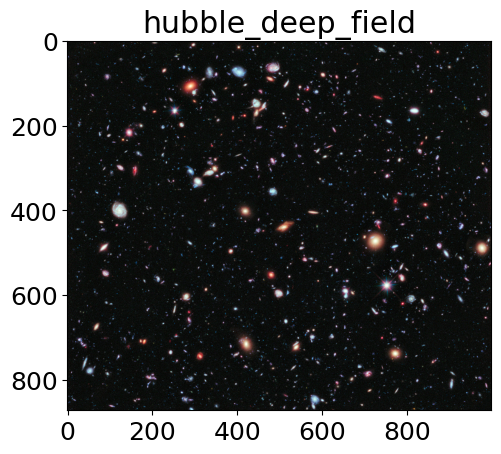

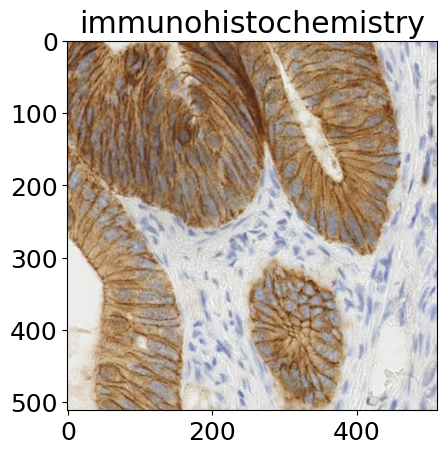

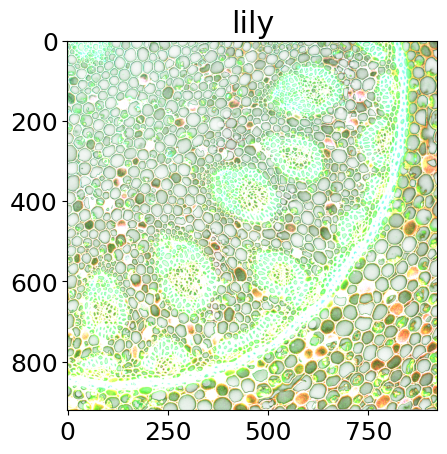

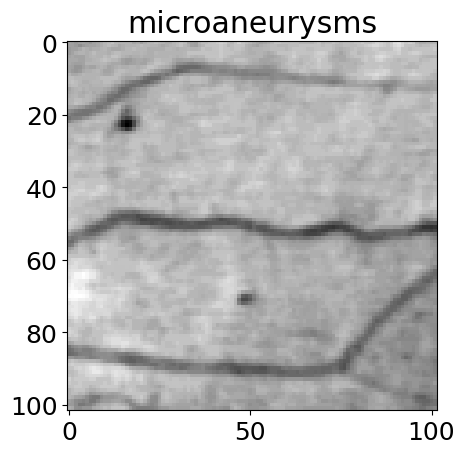

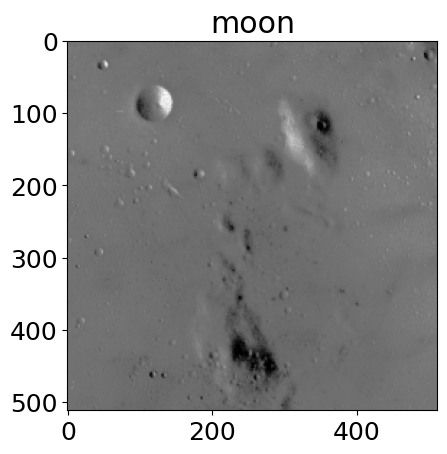

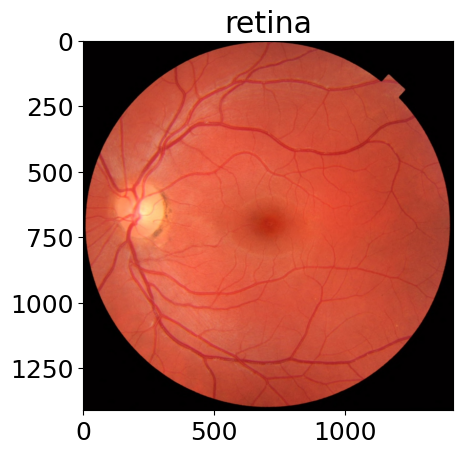

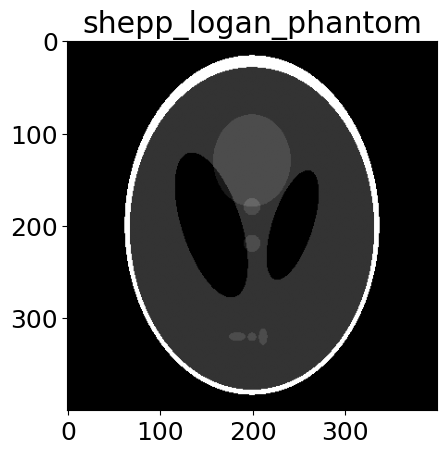

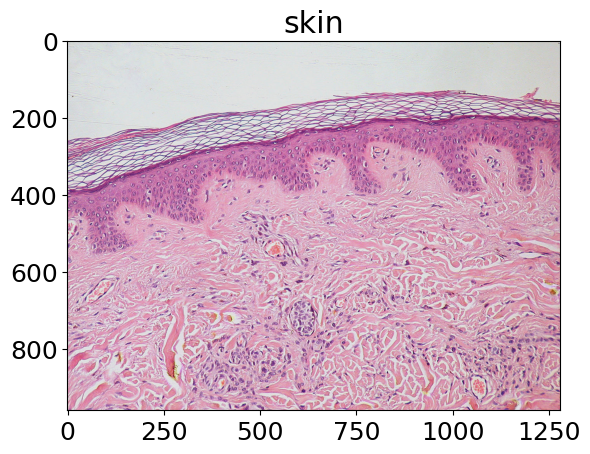

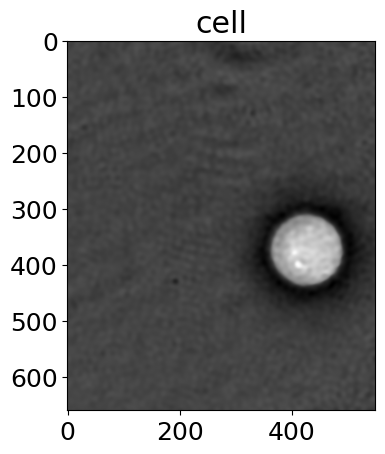

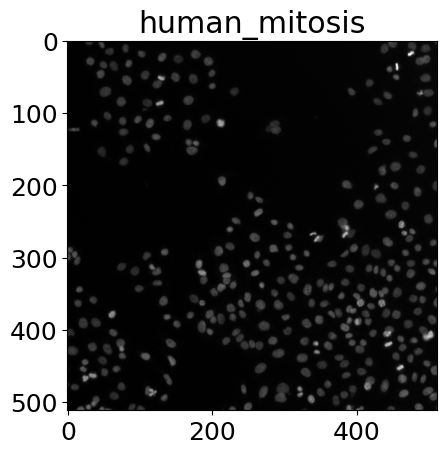

In [17]:
import matplotlib.pyplot as plt
import matplotlib
import numpy as np

from skimage import data

matplotlib.rcParams['font.size'] = 18

images = (
    'hubble_deep_field',
    'immunohistochemistry',
    'lily',
    'microaneurysms',
    'moon',
    'retina',
    'shepp_logan_phantom',
    'skin',
    'cell',
    'human_mitosis',
)


for name in images:
    caller = getattr(data, name)
    image = caller()
    print(name, " ", image.shape)
    plt.figure()
    plt.title(name)
    if image.ndim == 2:
        plt.imshow(image, cmap=plt.cm.gray)
    else:
        plt.imshow(image)

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0..4095].


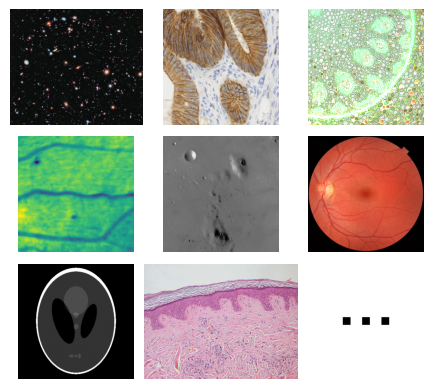

In [23]:
fig, axs = plt.subplots(nrows=3, ncols=3)
for ax in axs.flat:
    ax.axis("off")
axs[0, 0].imshow(data.hubble_deep_field())
axs[0, 1].imshow(data.immunohistochemistry())
axs[0, 2].imshow(data.lily())
axs[1, 0].imshow(data.microaneurysms())
axs[1, 1].imshow(data.moon(), cmap=plt.cm.gray)
axs[1, 2].imshow(data.retina())
axs[2, 0].imshow(data.shepp_logan_phantom(), cmap=plt.cm.gray)
axs[2, 1].imshow(data.skin())
further_img = np.full((300, 300), 255)
for xpos in [100, 150, 200]:
    further_img[150 - 10 : 150 + 10, xpos - 10 : xpos + 10] = 0
axs[2, 2].imshow(further_img, cmap=plt.cm.gray)
plt.subplots_adjust(wspace=-0.3, hspace=0.1)

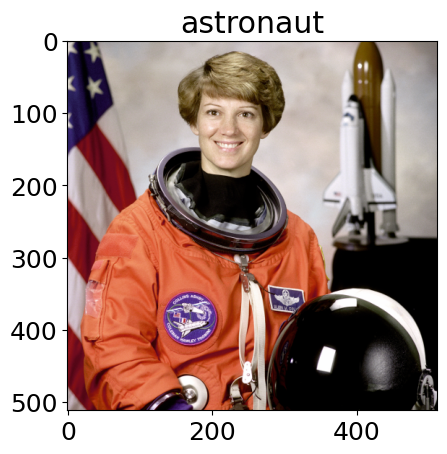

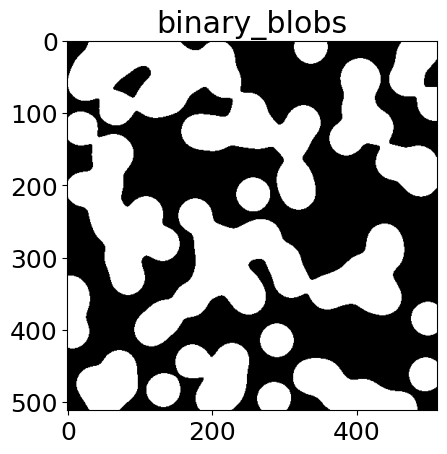

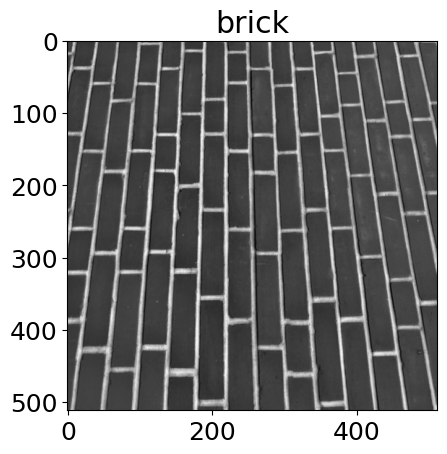

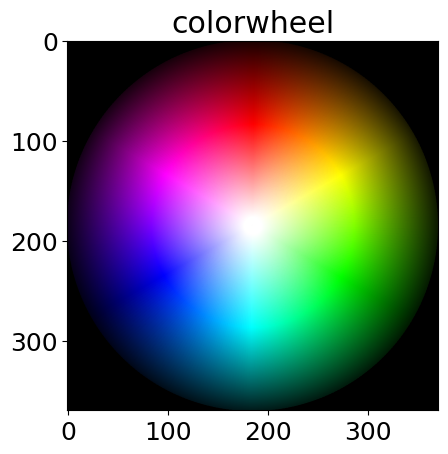

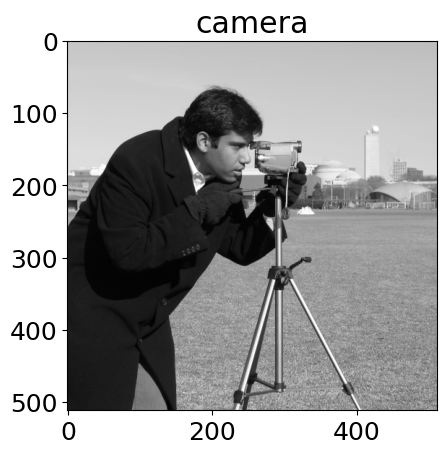

...

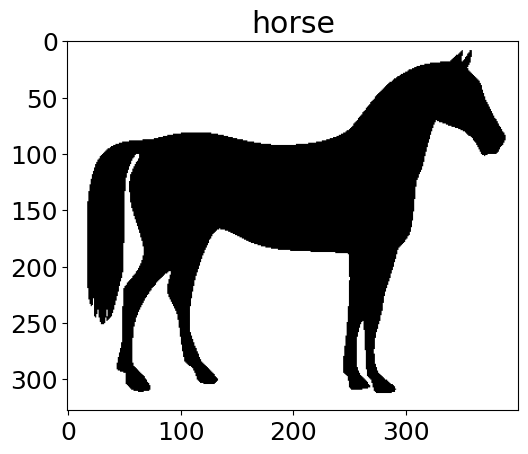

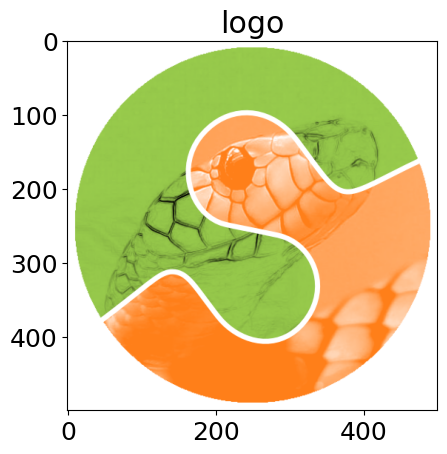

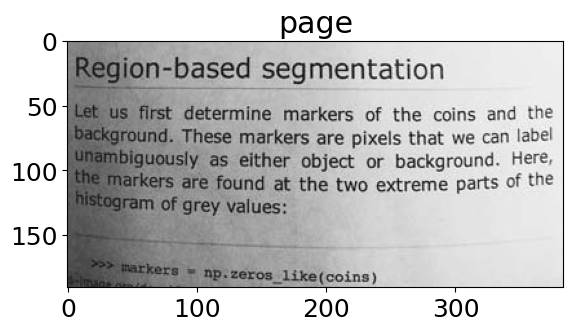

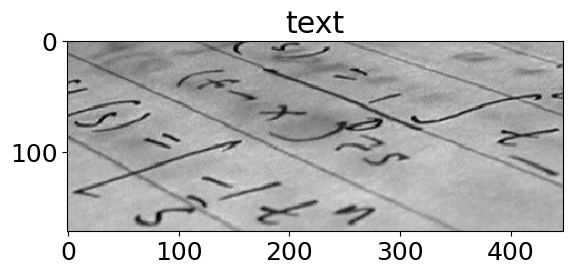

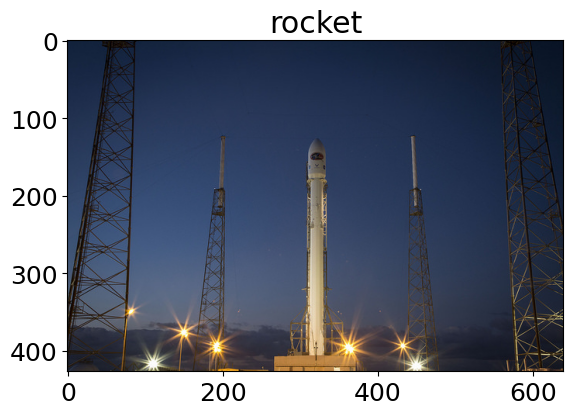

In [24]:
import matplotlib.pyplot as plt
import matplotlib
import numpy as np

from skimage import data

matplotlib.rcParams['font.size'] = 18

images = (
    'astronaut',
    'binary_blobs',
    'brick',
    'colorwheel',
    'camera',
    'cat',
    'checkerboard',
    'clock',
    'coffee',
    'coins',
    'eagle',
    'grass',
    'gravel',
    'horse',
    'logo',
    'page',
    'text',
    'rocket',
)


for name in images:
    caller = getattr(data, name)
    image = caller()
    plt.figure()
    plt.title(name)
    if image.ndim == 2:
        plt.imshow(image, cmap=plt.cm.gray)
    else:
        plt.imshow(image)

plt.show()

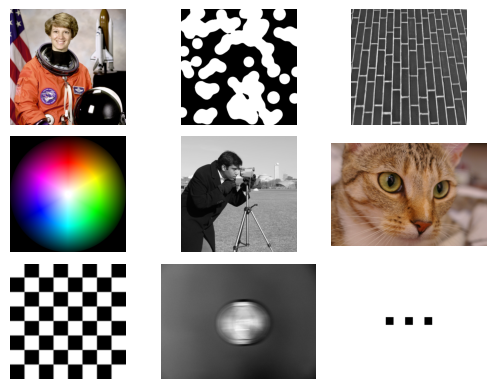

In [25]:
fig, axs = plt.subplots(nrows=3, ncols=3)
for ax in axs.flat:
    ax.axis("off")
axs[0, 0].imshow(data.astronaut())
axs[0, 1].imshow(data.binary_blobs(), cmap=plt.cm.gray)
axs[0, 2].imshow(data.brick(), cmap=plt.cm.gray)
axs[1, 0].imshow(data.colorwheel())
axs[1, 1].imshow(data.camera(), cmap=plt.cm.gray)
axs[1, 2].imshow(data.cat())
axs[2, 0].imshow(data.checkerboard(), cmap=plt.cm.gray)
axs[2, 1].imshow(data.clock(), cmap=plt.cm.gray)
further_img = np.full((300, 300), 255)
for xpos in [100, 150, 200]:
    further_img[150 - 10 : 150 + 10, xpos - 10 : xpos + 10] = 0
axs[2, 2].imshow(further_img, cmap=plt.cm.gray)
plt.subplots_adjust(wspace=0.1, hspace=0.1)

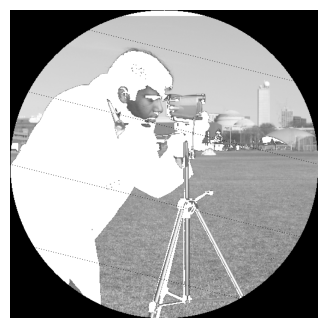

In [27]:
import numpy as np
from skimage import data
import matplotlib.pyplot as plt

# Load the standard 'camera' test image (grayscale, 512x512)
camera = data.camera()

# Set the first 10 rows of the image to 0 (black)
camera[:10] = 0

# Create a mask for all pixels with intensity less than 87
mask = camera < 87

# Set all pixels in the mask to 255 (white)
camera[mask] = 255

# Create index arrays for the x and y axes
inds_x = np.arange(len(camera))  # [0, 1, ..., 511]
inds_y = (4 * inds_x) % len(camera)  # [0, 4, 8, ..., wraps around at 512]

# Set a diagonal-like pattern of pixels to 0 (black)
camera[inds_x, inds_y] = 0

# Get the shape of the image
l_x, l_y = camera.shape[0], camera.shape[1]

# Create open grid arrays for the coordinates
X, Y = np.ogrid[:l_x, :l_y]

# Create a circular mask for the outer region (outside a central disk)
outer_disk_mask = (X - l_x / 2) ** 2 + (Y - l_y / 2) ** 2 > (l_x / 2) ** 2

# Set all pixels outside the central disk to 0 (black)
camera[outer_disk_mask] = 0

# Plot the modified image
plt.figure(figsize=(4, 4))
plt.imshow(camera, cmap='gray')
plt.axis('off')
plt.show()

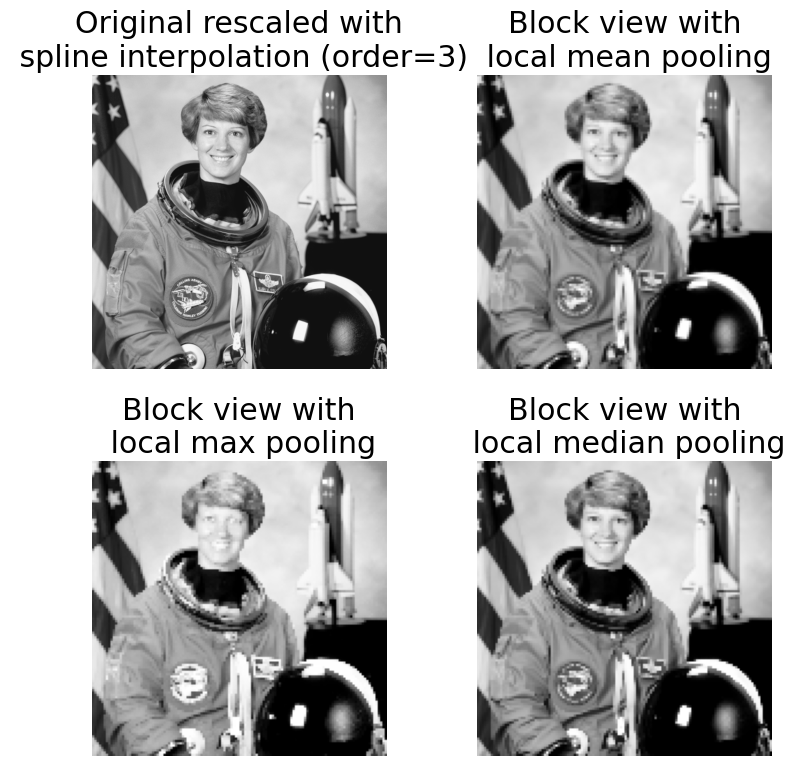

In [28]:
import numpy as np
from scipy import ndimage as ndi
from matplotlib import pyplot as plt
import matplotlib.cm as cm

from skimage import data
from skimage import color
from skimage.util import view_as_blocks


# get astronaut from skimage.data in grayscale
l = color.rgb2gray(data.astronaut())

# size of blocks
block_shape = (4, 4)

# see astronaut as a matrix of blocks (of shape block_shape)
view = view_as_blocks(l, block_shape)

# collapse the last two dimensions in one
flatten_view = view.reshape(view.shape[0], view.shape[1], -1)

# resampling the image by taking either the `mean`,
# the `max` or the `median` value of each blocks.
mean_view = np.mean(flatten_view, axis=2)
max_view = np.max(flatten_view, axis=2)
median_view = np.median(flatten_view, axis=2)

# display resampled images
fig, axes = plt.subplots(2, 2, figsize=(8, 8), sharex=True, sharey=True)
ax = axes.ravel()

l_resized = ndi.zoom(l, 2, order=3)
ax[0].set_title("Original rescaled with\n spline interpolation (order=3)")
ax[0].imshow(l_resized, extent=(-0.5, 128.5, 128.5, -0.5), cmap=cm.Greys_r)

ax[1].set_title("Block view with\n local mean pooling")
ax[1].imshow(mean_view, cmap=cm.Greys_r)

ax[2].set_title("Block view with\n local max pooling")
ax[2].imshow(max_view, cmap=cm.Greys_r)

ax[3].set_title("Block view with\n local median pooling")
ax[3].imshow(median_view, cmap=cm.Greys_r)

for a in ax:
    a.set_axis_off()

fig.tight_layout()
plt.show()

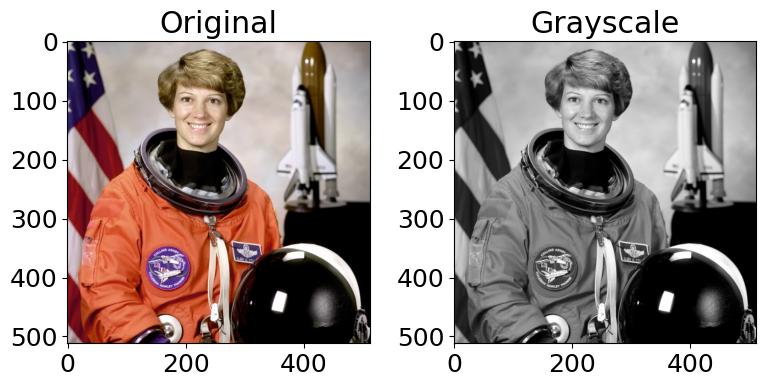

In [35]:
import matplotlib.pyplot as plt

from skimage import data
from skimage.color import rgb2gray

original = data.astronaut()
grayscale = rgb2gray(original)

fig, axes = plt.subplots(1, 2, figsize=(8, 4))
ax = axes.ravel()

ax[0].imshow(original)
ax[0].set_title("Original")
ax[1].imshow(grayscale, cmap=plt.cm.gray)
ax[1].set_title("Grayscale")

fig.tight_layout()
plt.show()

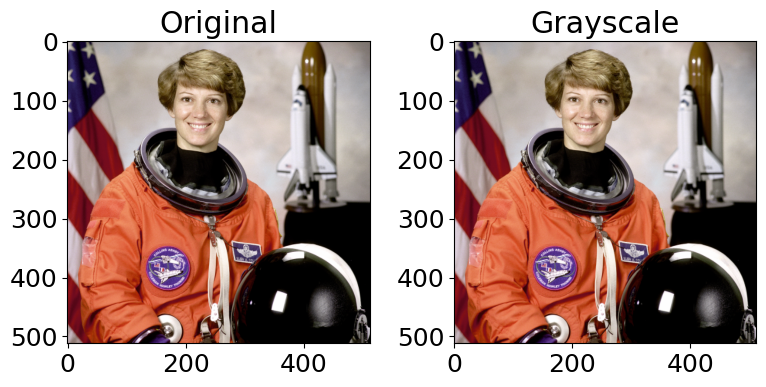

In [36]:
original = data.astronaut()

fig, axes = plt.subplots(1, 2, figsize=(8, 4))
ax = axes.ravel()

ax[0].imshow(original)
ax[0].set_title("Original")
ax[1].imshow(original, cmap='gray')
ax[1].set_title("Grayscale")

fig.tight_layout()
plt.show()

In [39]:
import matplotlib.pyplot as plt

from skimage import data
from skimage.color import rgb2hsv

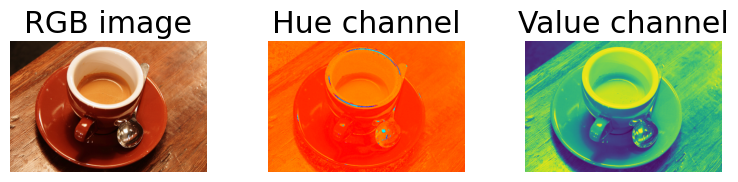

In [40]:
rgb_img = data.coffee()
hsv_img = rgb2hsv(rgb_img)
hue_img = hsv_img[:, :, 0]
value_img = hsv_img[:, :, 2]

fig, (ax0, ax1, ax2) = plt.subplots(ncols=3, figsize=(8, 2))

ax0.imshow(rgb_img)
ax0.set_title("RGB image")
ax0.axis('off')
ax1.imshow(hue_img, cmap='hsv')
ax1.set_title("Hue channel")
ax1.axis('off')
ax2.imshow(value_img)
ax2.set_title("Value channel")
ax2.axis('off')

fig.tight_layout()

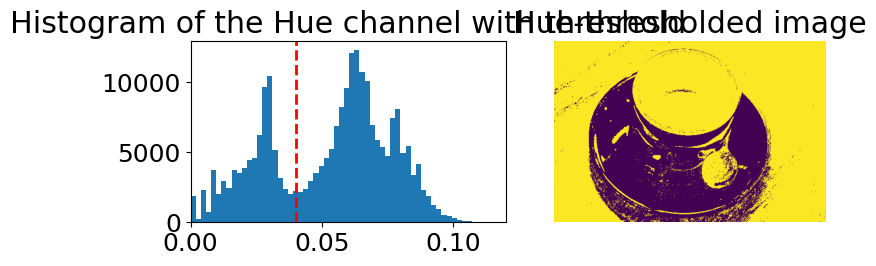

In [41]:
hue_threshold = 0.04
binary_img = hue_img > hue_threshold

fig, (ax0, ax1) = plt.subplots(ncols=2, figsize=(8, 3))

ax0.hist(hue_img.ravel(), 512)
ax0.set_title("Histogram of the Hue channel with threshold")
ax0.axvline(x=hue_threshold, color='r', linestyle='dashed', linewidth=2)
ax0.set_xbound(0, 0.12)
ax1.imshow(binary_img)
ax1.set_title("Hue-thresholded image")
ax1.axis('off')

fig.tight_layout()

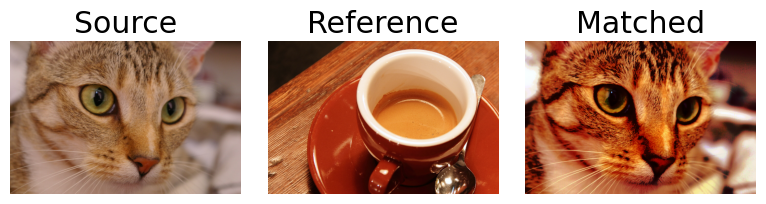

In [42]:
import matplotlib.pyplot as plt

from skimage import data
from skimage import exposure
from skimage.exposure import match_histograms

reference = data.coffee()
image = data.chelsea()

matched = match_histograms(image, reference, channel_axis=-1)

fig, (ax1, ax2, ax3) = plt.subplots(
    nrows=1, ncols=3, figsize=(8, 3), sharex=True, sharey=True
)
for aa in (ax1, ax2, ax3):
    aa.set_axis_off()

ax1.imshow(image)
ax1.set_title('Source')
ax2.imshow(reference)
ax2.set_title('Reference')
ax3.imshow(matched)
ax3.set_title('Matched')

plt.tight_layout()
plt.show()

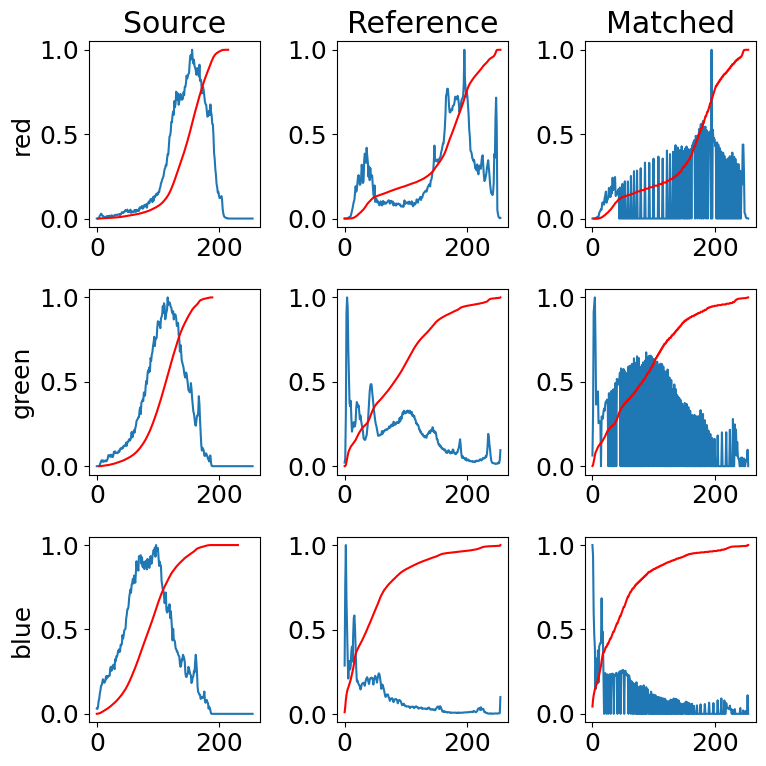

In [44]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(8, 8))


for i, img in enumerate((image, reference, matched)):
    for c, c_color in enumerate(('red', 'green', 'blue')):
        img_hist, bins = exposure.histogram(img[..., c], source_range='dtype')
        axes[c, i].plot(bins, img_hist / img_hist.max())
        img_cdf, bins = exposure.cumulative_distribution(img[..., c])
        axes[c, i].plot(bins, img_cdf,color='red')
        axes[c, 0].set_ylabel(c_color)

axes[0, 0].set_title('Source')
axes[0, 1].set_title('Reference')
axes[0, 2].set_title('Matched')

plt.tight_layout()
plt.show()

# Separate colors in immunohistochemical staining

Color deconvolution consists in the separation of features by their colors.

In this example we separate the immunohistochemical (IHC) staining from the hematoxylin counterstaining. The separation is achieved with the method described in [1] and known as “color deconvolution”.

The IHC staining expression of the FHL2 protein is here revealed with diaminobenzidine (DAB) which gives a brown color.

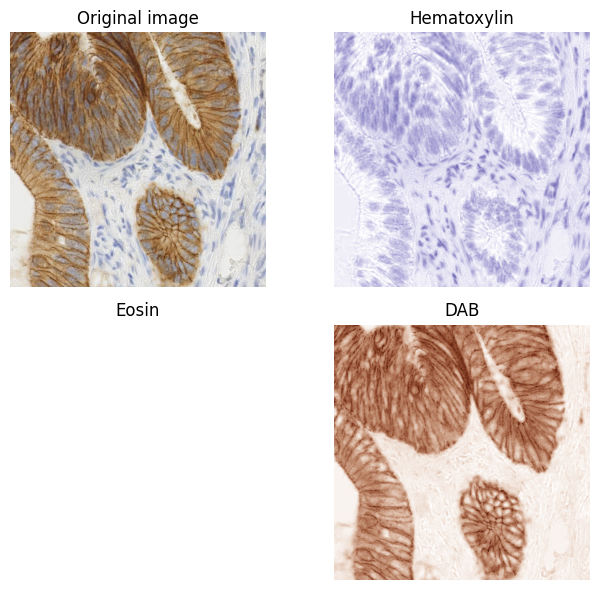

In [7]:
import numpy as np
import matplotlib.pyplot as plt

from skimage import data
from skimage.color import rgb2hed, hed2rgb

# Example IHC image
ihc_rgb = data.immunohistochemistry()

# Separate the stains from the IHC image
ihc_hed = rgb2hed(ihc_rgb)

# Create an RGB image for each of the stains
null = np.zeros_like(ihc_hed[:, :, 0])
ihc_h = hed2rgb(np.stack((ihc_hed[:, :, 0], null, null), axis=-1))
ihc_e = hed2rgb(np.stack((null, ihc_hed[:, :, 1], null), axis=-1))
ihc_d = hed2rgb(np.stack((null, null, ihc_hed[:, :, 2]), axis=-1))

# Display
fig, axes = plt.subplots(2, 2, figsize=(7, 6), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(ihc_rgb)
ax[0].set_title("Original image")

ax[1].imshow(ihc_h)
ax[1].set_title("Hematoxylin")

ax[2].imshow(ihc_e)
ax[2].set_title("Eosin")  # Note that there is no Eosin stain in this image

ax[3].imshow(ihc_d)
ax[3].set_title("DAB")

for a in ax.ravel():
    a.axis('off')

fig.tight_layout()

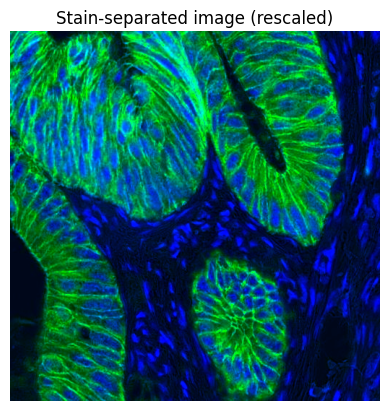

In [8]:
from skimage.exposure import rescale_intensity

# Rescale hematoxylin and DAB channels and give them a fluorescence look
h = rescale_intensity(
    ihc_hed[:, :, 0],
    out_range=(0, 1),
    in_range=(0, np.percentile(ihc_hed[:, :, 0], 99)),
)
d = rescale_intensity(
    ihc_hed[:, :, 2],
    out_range=(0, 1),
    in_range=(0, np.percentile(ihc_hed[:, :, 2], 99)),
)

# Cast the two channels into an RGB image, as the blue and green channels
# respectively
zdh = np.dstack((null, d, h))

fig = plt.figure()
axis = plt.subplot(1, 1, 1, sharex=ax[0], sharey=ax[0])
axis.imshow(zdh)
axis.set_title('Stain-separated image (rescaled)')
axis.axis('off')
plt.show()

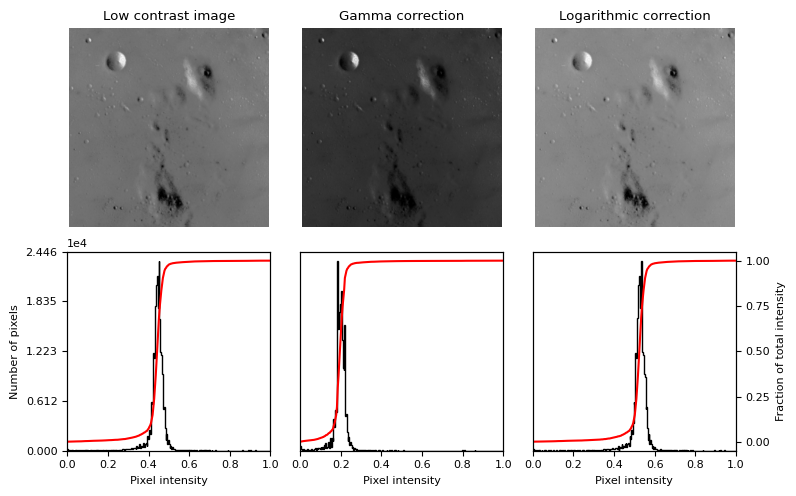

In [28]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

from skimage import data, img_as_float
from skimage import exposure

matplotlib.rcParams['font.size'] = 8


def plot_img_and_hist(image, axes, bins=256):
    """Plot an image along with its histogram and cumulative histogram."""
    image = img_as_float(image)
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    # Display image
    ax_img.imshow(image, cmap=plt.cm.gray)
    ax_img.set_axis_off()

    # Display histogram
    ax_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('Pixel intensity')
    ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])

    # Display cumulative distribution
    img_cdf, bins = exposure.cumulative_distribution(image, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])

    return ax_img, ax_hist, ax_cdf


# Load an example image
img = data.moon()

# Gamma
gamma_corrected = exposure.adjust_gamma(img, 2)

# Logarithmic
logarithmic_corrected = exposure.adjust_log(img, 1)

# Display results
fig = plt.figure(figsize=(8, 5))
axes = np.zeros((2, 3), dtype=object)
axes[0, 0] = plt.subplot(2, 3, 1)
axes[0, 1] = plt.subplot(2, 3, 2, sharex=axes[0, 0], sharey=axes[0, 0])
axes[0, 2] = plt.subplot(2, 3, 3, sharex=axes[0, 0], sharey=axes[0, 0])
axes[1, 0] = plt.subplot(2, 3, 4)
axes[1, 1] = plt.subplot(2, 3, 5)
axes[1, 2] = plt.subplot(2, 3, 6)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img, axes[:, 0])
ax_img.set_title('Low contrast image')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Number of pixels')
ax_hist.set_yticks(np.linspace(0, y_max, 5))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(gamma_corrected, axes[:, 1])
ax_img.set_title('Gamma correction')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(logarithmic_corrected, axes[:, 2])
ax_img.set_title('Logarithmic correction')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 5))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

# segmentation

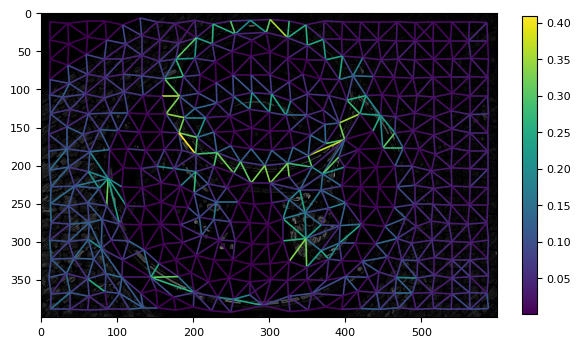

In [39]:
from skimage import graph
from skimage import data, segmentation, color, filters
from matplotlib import pyplot as plt


img = data.coffee()
gimg = color.rgb2gray(img)

labels = segmentation.slic(img, compactness=30, n_segments=400, start_label=1)
edges = filters.sobel(gimg)
edges_rgb = color.gray2rgb(edges)

g = graph.rag_boundary(labels, edges)
lc = graph.show_rag(
    labels, g, edges_rgb, img_cmap=None, edge_cmap='viridis', edge_width=1.2
)

plt.colorbar(lc, fraction=0.03)
plt.show()

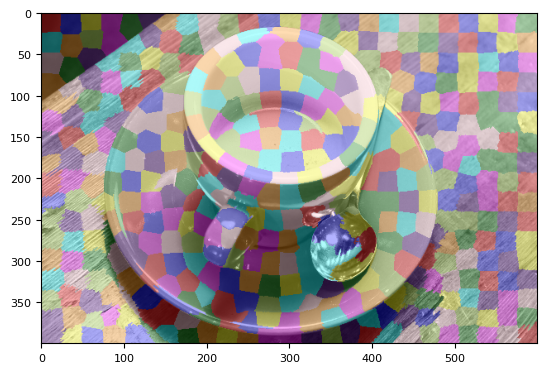

In [40]:
out1 = color.label2rgb(labels, img)
plt.imshow(out1)

In [41]:
labels

array([[  1,   1,   1, ...,  25,  25,  25],
       [  1,   1,   1, ...,  25,  25,  25],
       [  1,   1,   1, ...,  25,  25,  25],
       ...,
       [406, 406, 406, ..., 401, 401, 401],
       [406, 406, 406, ..., 401, 401, 401],
       [406, 406, 406, ..., 401, 401, 401]])

In [42]:
g

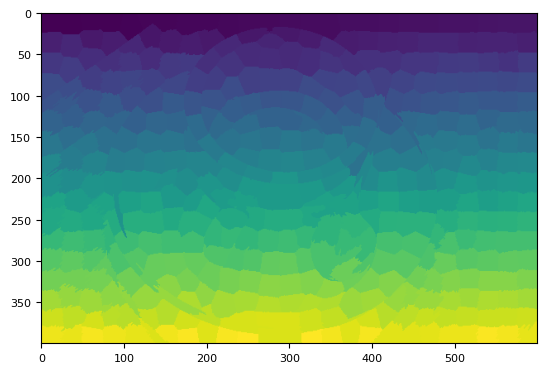

In [43]:
plt.imshow(labels)

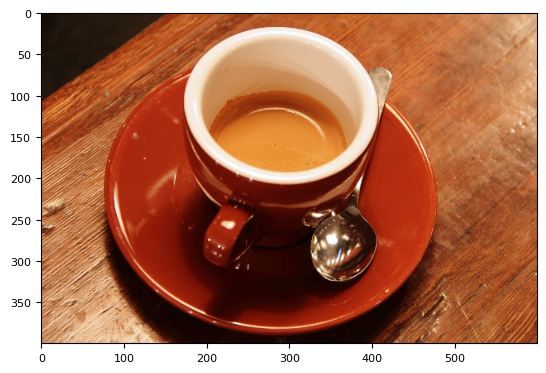

In [44]:
plt.imshow(img)

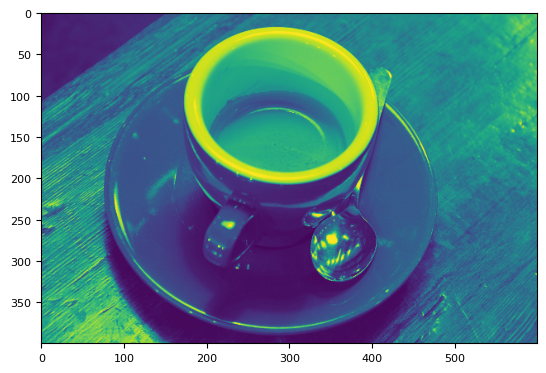

In [45]:
plt.imshow(gimg)

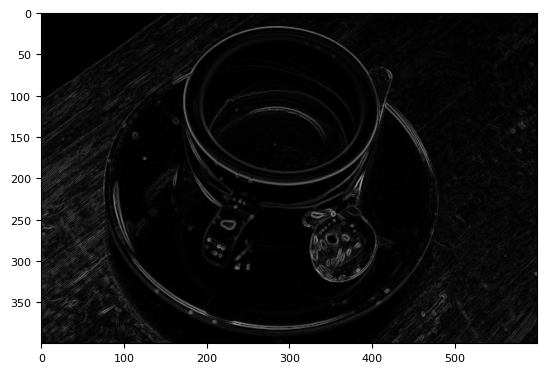

In [46]:
plt.imshow(edges_rgb)

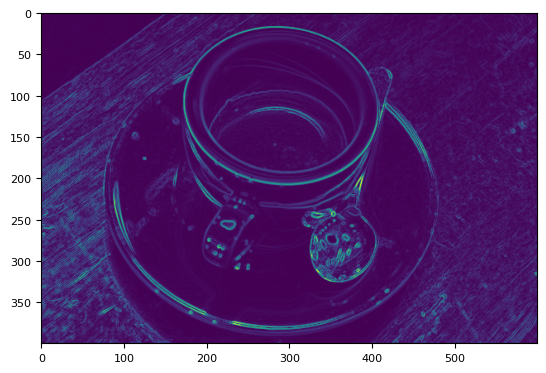

In [47]:
plt.imshow(edges)

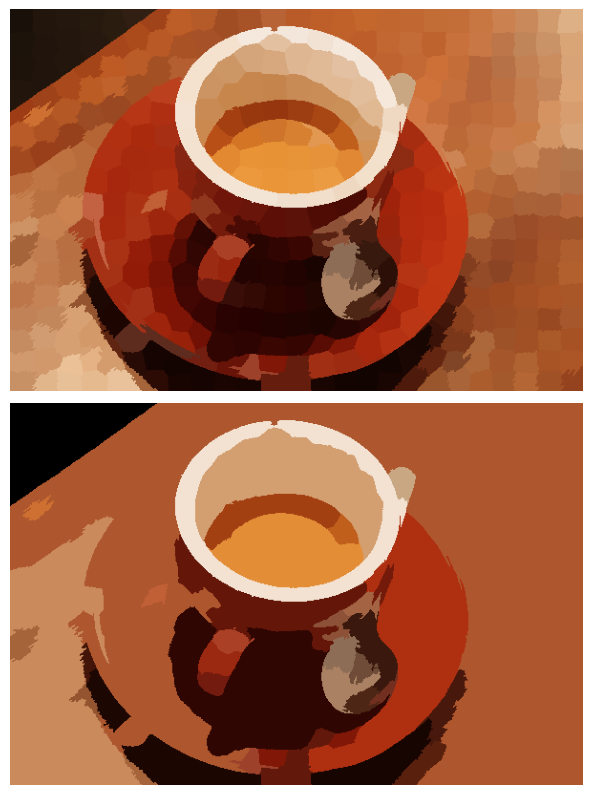

In [48]:
from skimage import data, segmentation, color
from skimage import graph
from matplotlib import pyplot as plt


img = data.coffee()

labels1 = segmentation.slic(img, compactness=30, n_segments=400, start_label=1)
out1 = color.label2rgb(labels1, img, kind='avg', bg_label=0)

g = graph.rag_mean_color(img, labels1)
labels2 = graph.cut_threshold(labels1, g, 29)
out2 = color.label2rgb(labels2, img, kind='avg', bg_label=0)

fig, ax = plt.subplots(nrows=2, sharex=True, sharey=True, figsize=(6, 8))

ax[0].imshow(out1)
ax[1].imshow(out2)

for a in ax:
    a.axis('off')

plt.tight_layout()

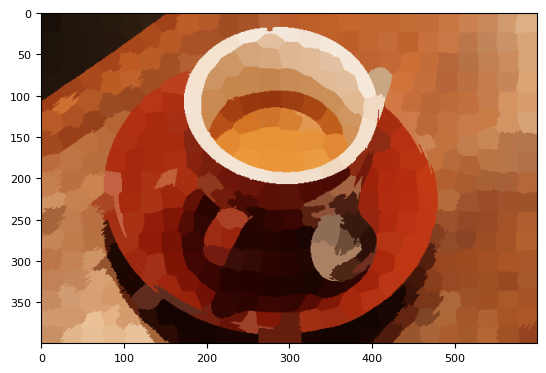

In [49]:
plt.imshow(out1)

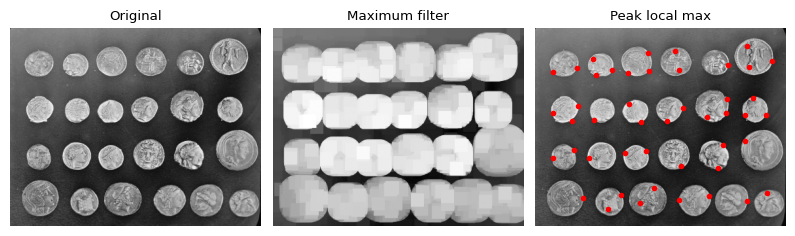

In [50]:
from scipy import ndimage as ndi
import matplotlib.pyplot as plt
from skimage.feature import peak_local_max
from skimage import data, img_as_float

im = img_as_float(data.coins())

# image_max is the dilation of im with a 20*20 structuring element
# It is used within peak_local_max function
image_max = ndi.maximum_filter(im, size=20, mode='constant')

# Comparison between image_max and im to find the coordinates of local maxima
coordinates = peak_local_max(im, min_distance=20)

# display results
fig, axes = plt.subplots(1, 3, figsize=(8, 3), sharex=True, sharey=True)
ax = axes.ravel()
ax[0].imshow(im, cmap=plt.cm.gray)
ax[0].axis('off')
ax[0].set_title('Original')

ax[1].imshow(image_max, cmap=plt.cm.gray)
ax[1].axis('off')
ax[1].set_title('Maximum filter')

ax[2].imshow(im, cmap=plt.cm.gray)
ax[2].autoscale(False)
ax[2].plot(coordinates[:, 1], coordinates[:, 0], 'r.')
ax[2].axis('off')
ax[2].set_title('Peak local max')

fig.tight_layout()

plt.show()

Niblack and Sauvola Thresholding


Niblack and Sauvola Thresholding
Niblack and Sauvola thresholds are local thresholding techniques that are useful for images where the background is not uniform, especially for text recognition [1], [2]. Instead of calculating a single global threshold for the entire image, several thresholds are calculated for every pixel by using specific formulae that take into account the mean and standard deviation of the local neighborhood (defined by a window centered around the pixel).

Here, we binarize an image using these algorithms compare it to a common global thresholding technique. Parameter window_size determines the size of the window that contains the surrounding pixels.



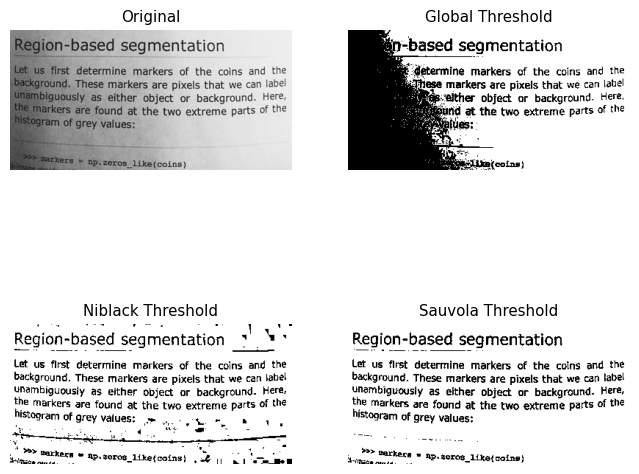

In [51]:
import matplotlib
import matplotlib.pyplot as plt

from skimage.data import page
from skimage.filters import threshold_otsu, threshold_niblack, threshold_sauvola


matplotlib.rcParams['font.size'] = 9


image = page()
binary_global = image > threshold_otsu(image)

window_size = 25
thresh_niblack = threshold_niblack(image, window_size=window_size, k=0.8)
thresh_sauvola = threshold_sauvola(image, window_size=window_size)

binary_niblack = image > thresh_niblack
binary_sauvola = image > thresh_sauvola

plt.figure(figsize=(8, 7))
plt.subplot(2, 2, 1)
plt.imshow(image, cmap=plt.cm.gray)
plt.title('Original')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title('Global Threshold')
plt.imshow(binary_global, cmap=plt.cm.gray)
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(binary_niblack, cmap=plt.cm.gray)
plt.title('Niblack Threshold')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(binary_sauvola, cmap=plt.cm.gray)
plt.title('Sauvola Threshold')
plt.axis('off')

plt.show()

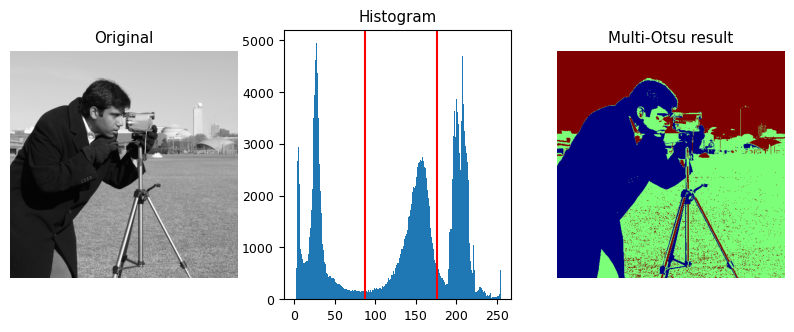

In [52]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

from skimage import data
from skimage.filters import threshold_multiotsu

# Setting the font size for all plots.
matplotlib.rcParams['font.size'] = 9

# The input image.
image = data.camera()

# Applying multi-Otsu threshold for the default value, generating
# three classes.
thresholds = threshold_multiotsu(image)

# Using the threshold values, we generate the three regions.
regions = np.digitize(image, bins=thresholds)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(10, 3.5))

# Plotting the original image.
ax[0].imshow(image, cmap='gray')
ax[0].set_title('Original')
ax[0].axis('off')

# Plotting the histogram and the two thresholds obtained from
# multi-Otsu.
ax[1].hist(image.ravel(), bins=255)
ax[1].set_title('Histogram')
for thresh in thresholds:
    ax[1].axvline(thresh, color='r')

# Plotting the Multi Otsu result.
ax[2].imshow(regions, cmap='jet')
ax[2].set_title('Multi-Otsu result')
ax[2].axis('off')

plt.subplots_adjust()

plt.show()

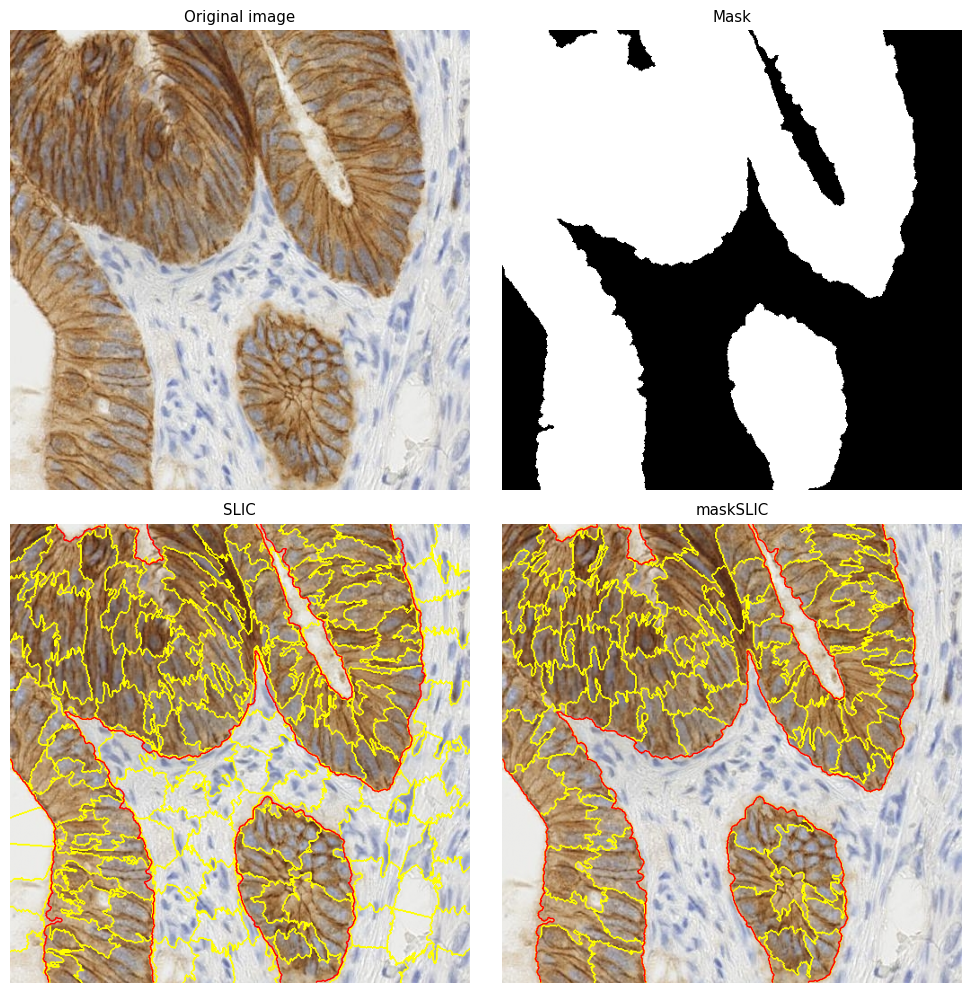

In [53]:
import matplotlib.pyplot as plt

from skimage import data
from skimage import color
from skimage import morphology
from skimage import segmentation

# Input data
img = data.immunohistochemistry()

# Compute a mask
lum = color.rgb2gray(img)
mask = morphology.remove_small_holes(
    morphology.remove_small_objects(lum < 0.7, 500), 500
)

mask = morphology.opening(mask, morphology.disk(3))

# SLIC result
slic = segmentation.slic(img, n_segments=200, start_label=1)

# maskSLIC result
m_slic = segmentation.slic(img, n_segments=100, mask=mask, start_label=1)

# Display result
fig, ax_arr = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(10, 10))
ax1, ax2, ax3, ax4 = ax_arr.ravel()

ax1.imshow(img)
ax1.set_title('Original image')

ax2.imshow(mask, cmap='gray')
ax2.set_title('Mask')

ax3.imshow(segmentation.mark_boundaries(img, slic))
ax3.contour(mask, colors='red', linewidths=1)
ax3.set_title('SLIC')

ax4.imshow(segmentation.mark_boundaries(img, m_slic))
ax4.contour(mask, colors='red', linewidths=1)
ax4.set_title('maskSLIC')

for ax in ax_arr.ravel():
    ax.set_axis_off()

plt.tight_layout()
plt.show()